# **Welcome To My final projract 🤍**

## **What is Airbnb ?**
### Airbnb began in 2008 when two designers who had space to share hosted three travelers looking for a place to stay. Now, millions of hosts and travelers choose to create a free Airbnb account so they can list their space and book unique accommodations anywhere in the world. And Airbnb experience hosts share their passions and interests with both travelers and locals.

![](https://cdn.menatech.net/wp-content/uploads/2017/12/airbnb.png)

# 1. Import libraries 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn import linear_model
from sklearn.metrics import r2_score 
from sklearn.metrics import mean_absolute_error,mean_absolute_percentage_error,mean_squared_error
from wordcloud import WordCloud
import plotly.express as px
import folium
import statsmodels.api as sm
import geopandas as gpd
import warnings
import missingno as msno
from wordcloud import WordCloud
from sklearn import preprocessing
from sklearn import tree
from sklearn.manifold import TSNE
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
%matplotlib inline 
warnings.filterwarnings('ignore')

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.3-CAPI-1.16.1). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


# 2. Load the Airbnb Open Dataset 

In [2]:
airbnb = pd.read_csv("../input/airbnbopendata/Airbnb_Open_Data.csv" , sep = "," , encoding = 'utf-8')

In [3]:
airbnb

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102594,6092437,Spare room in Williamsburg,12312296767,verified,Krik,Brooklyn,Williamsburg,40.70862,-73.94651,United States,...,$169,1.0,0.0,NaN,NaN,3.0,1.0,227.0,No Smoking No Parties or Events of any kind Pl...,NaN
102595,6092990,Best Location near Columbia U,77864383453,unconfirmed,Mifan,Manhattan,Morningside Heights,40.80460,-73.96545,United States,...,$167,1.0,1.0,7/6/2015,0.02,2.0,2.0,395.0,House rules: Guests agree to the following ter...,NaN
102596,6093542,"Comfy, bright room in Brooklyn",69050334417,unconfirmed,Megan,Brooklyn,Park Slope,40.67505,-73.98045,United States,...,$198,3.0,0.0,NaN,NaN,5.0,1.0,342.0,NaN,NaN
102597,6094094,Big Studio-One Stop from Midtown,11160591270,unconfirmed,Christopher,Queens,Long Island City,40.74989,-73.93777,United States,...,$109,2.0,5.0,10/11/2015,0.10,3.0,1.0,386.0,NaN,NaN


# 3. Discover the Dataset 

In [4]:
# descovier the columns 
airbnb.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

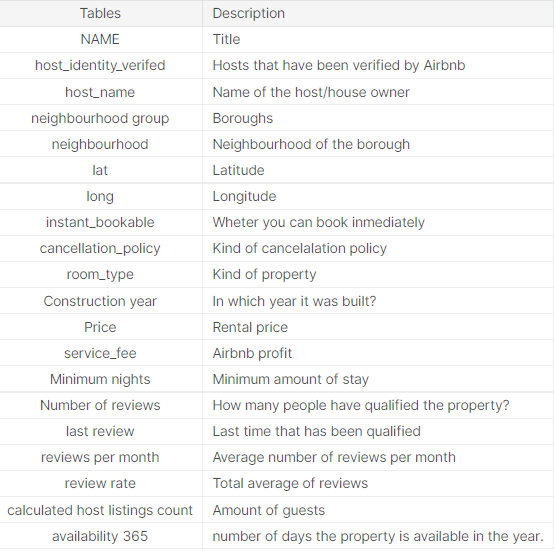

In [5]:
# check nulls
airbnb.isnull().sum()

id                                     0
NAME                                 250
host id                                0
host_identity_verified               289
host name                            406
neighbourhood group                   29
neighbourhood                         16
lat                                    8
long                                   8
country                              532
country code                         131
instant_bookable                     105
cancellation_policy                   76
room type                              0
Construction year                    214
price                                247
service fee                          273
minimum nights                       409
number of reviews                    183
last review                        15893
reviews per month                  15879
review rate number                   326
calculated host listings count       319
availability 365                     448
house_rules     

In [6]:
# information about the dataset
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [7]:
# descibtion of dataset 
airbnb.describe()

,id,host id,lat,long,Construction year,minimum nights,number of reviews,reviews per month,review rate number,calculated host listings count,availability 365
count,1.025990e+05,1.025990e+05,102591.000000,102591.000000,102385.000000,102190.000000,102416.000000,86720.000000,102273.000000,102280.000000,102151.000000
mean,2.914623e+07,4.925411e+10,40.728094,-73.949644,2012.487464,8.135845,27.483743,1.374022,3.279106,7.936605,141.133254
std,1.625751e+07,2.853900e+10,0.055857,0.049521,5.765556,30.553781,49.508954,1.746621,1.284657,32.218780,135.435024
min,1.001254e+06,1.236005e+08,40.499790,-74.249840,2003.000000,-1223.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,1.508581e+07,2.458333e+10,40.688740,-73.982580,2007.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,2.913660e+07,4.911774e+10,40.722290,-73.954440,2012.000000,3.000000,7.000000,0.740000,3.000000,1.000000,96.000000
75%,4.320120e+07,7.399650e+10,40.762760,-73.932350,2017.000000,5.000000,30.000000,2.000000,4.000000,2.000000,269.000000
max,5.736742e+07,9.876313e+10,40.916970,-73.705220,2022.000000,5645.000000,1024.000000,90.000000,5.000000,332.000000,3677.000000


In [8]:
# descripton with more vusilization 
airbnb.describe(include='all').style.background_gradient(cmap='Blues').set_properties(**{'font-family':'Segoe UI'})

,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,country code,instant_bookable,cancellation_policy,room type,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
count,102599.000000,102349,102599.000000,102310,102193,102570,102583,102591.000000,102591.000000,102067,102468,102494,102523,102599,102385.000000,102352,102326,102190.000000,102416.000000,86706,86720.000000,102273.000000,102280.000000,102151.000000,50468,2
unique,nan,61281,nan,2,13190,7,224,nan,nan,1,1,2,3,4,nan,1151,231,nan,nan,2477,nan,nan,nan,nan,1976,1
top,nan,Home away from home,nan,unconfirmed,Michael,Manhattan,Bedford-Stuyvesant,nan,nan,United States,US,False,moderate,Entire home/apt,nan,$206,$41,nan,nan,6/23/2019,nan,nan,nan,nan,#NAME?,41662/AL
freq,nan,33,nan,51200,881,43792,7937,nan,nan,102067,102468,51474,34343,53701,nan,137,526,nan,nan,2443,nan,nan,nan,nan,2712,2
mean,29146234.522130,nan,49254111474.328667,nan,nan,nan,nan,40.728094,-73.949644,nan,nan,nan,nan,nan,2012.487464,nan,nan,8.135845,27.483743,nan,1.374022,3.279106,7.936605,141.133254,nan,nan
std,16257505.607309,nan,28538996644.374878,nan,nan,nan,nan,0.055857,0.049521,nan,nan,nan,nan,nan,5.765556,nan,nan,30.553781,49.508954,nan,1.746621,1.284657,32.218780,135.435024,nan,nan
min,1001254.000000,nan,123600518.000000,nan,nan,nan,nan,40.499790,-74.249840,nan,nan,nan,nan,nan,2003.000000,nan,nan,-1223.000000,0.000000,nan,0.010000,1.000000,1.000000,-10.000000,nan,nan
25%,15085814.500000,nan,24583328475.000000,nan,nan,nan,nan,40.688740,-73.982580,nan,nan,nan,nan,nan,2007.000000,nan,nan,2.000000,1.000000,nan,0.220000,2.000000,1.000000,3.000000,nan,nan
50%,29136603.000000,nan,49117739352.000000,nan,nan,nan,nan,40.722290,-73.954440,nan,nan,nan,nan,nan,2012.000000,nan,nan,3.000000,7.000000,nan,0.740000,3.000000,1.000000,96.000000,nan,nan
75%,43201198.000000,nan,73996495817.000000,nan,nan,nan,nan,40.762760,-73.932350,nan,nan,nan,nan,nan,2017.000000,nan,nan,5.000000,30.000000,nan,2.000000,4.000000,2.000000,269.000000,nan,nan


<AxesSubplot:>

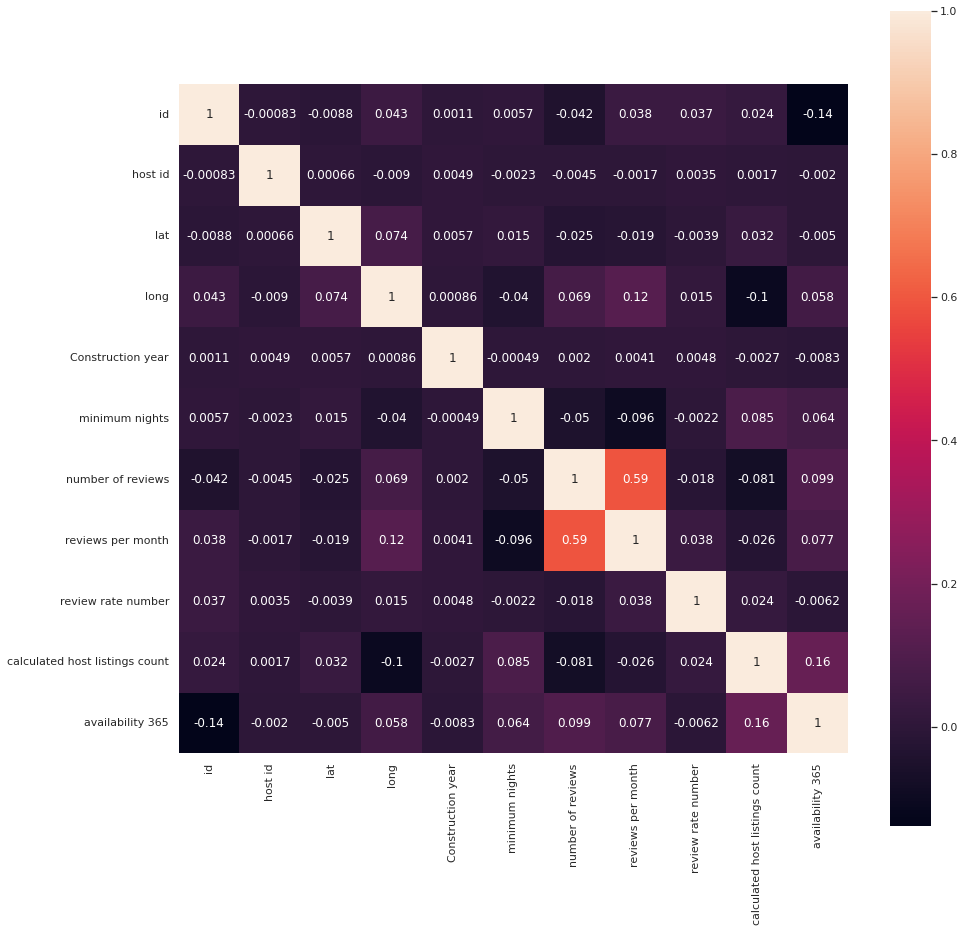

In [9]:
# heatmap of correlation
sns.set(rc={"figure.figsize":(15, 15)})
sns.heatmap(airbnb.corr(), annot=True, square=True)

In [10]:
airbnb.shape

(102599, 26)

# 4. Data preprocessing
 

### a. remove duplicated 

In [11]:
airbnb.drop_duplicates(inplace=True)

In [12]:
airbnb.shape

(102058, 26)

541 duplicated rows 

In [13]:
print("Total columns before dropping : ", len(airbnb.columns), "\n")
print("Columns with more than 50% missing values: ")
print(airbnb.columns[airbnb.isnull().mean() > 0.5], "\n")
airbnb = airbnb.drop(airbnb.columns[airbnb.isnull().mean() > 0.5], axis=1)
print("Total columns after dropping:", len(airbnb.columns))

Total columns before dropping :  26 

Columns with more than 50% missing values: 
Index(['house_rules', 'license'], dtype='object') 

Total columns after dropping: 24


### b. Change in values type 

In [14]:
# Convert 'last review' column to datetime type
airbnb['last review'] = pd.to_datetime(airbnb['last review'])

In [15]:
airbnb['price'] = airbnb['price'].str.replace('$', '')
airbnb['price'] = airbnb['price'].str.replace(',', '')
airbnb['price'] = airbnb['price'].astype(float)

In [16]:
airbnb['price']

0          966.0
1          142.0
2          620.0
3          368.0
4          204.0
           ...  
102053     696.0
102054     909.0
102055     387.0
102056     848.0
102057    1128.0
Name: price, Length: 102058, dtype: float64

In [17]:
airbnb['service fee'] = airbnb['service fee'].str.replace('$', '')
airbnb['service fee'] = airbnb['service fee'].str.replace(',', '')
airbnb['service fee'] = airbnb['service fee'].astype(float)

In [18]:
airbnb['service fee']

0         193.0
1          28.0
2         124.0
3          74.0
4          41.0
          ...  
102053      NaN
102054      NaN
102055      NaN
102056      NaN
102057      NaN
Name: service fee, Length: 102058, dtype: float64

### c. removed nulls values from some colums 

In [19]:
airbnb.isnull().sum()

id                                    0
NAME                                250
host id                               0
host_identity_verified              289
host name                           404
neighbourhood group                  29
neighbourhood                        16
lat                                   8
long                                  8
country                             532
country code                        131
instant_bookable                    105
cancellation_policy                  76
room type                             0
Construction year                   214
price                               247
service fee                         273
minimum nights                      400
number of reviews                   183
last review                       15832
reviews per month                 15818
review rate number                  319
calculated host listings count      319
availability 365                    448
dtype: int64

<AxesSubplot:>

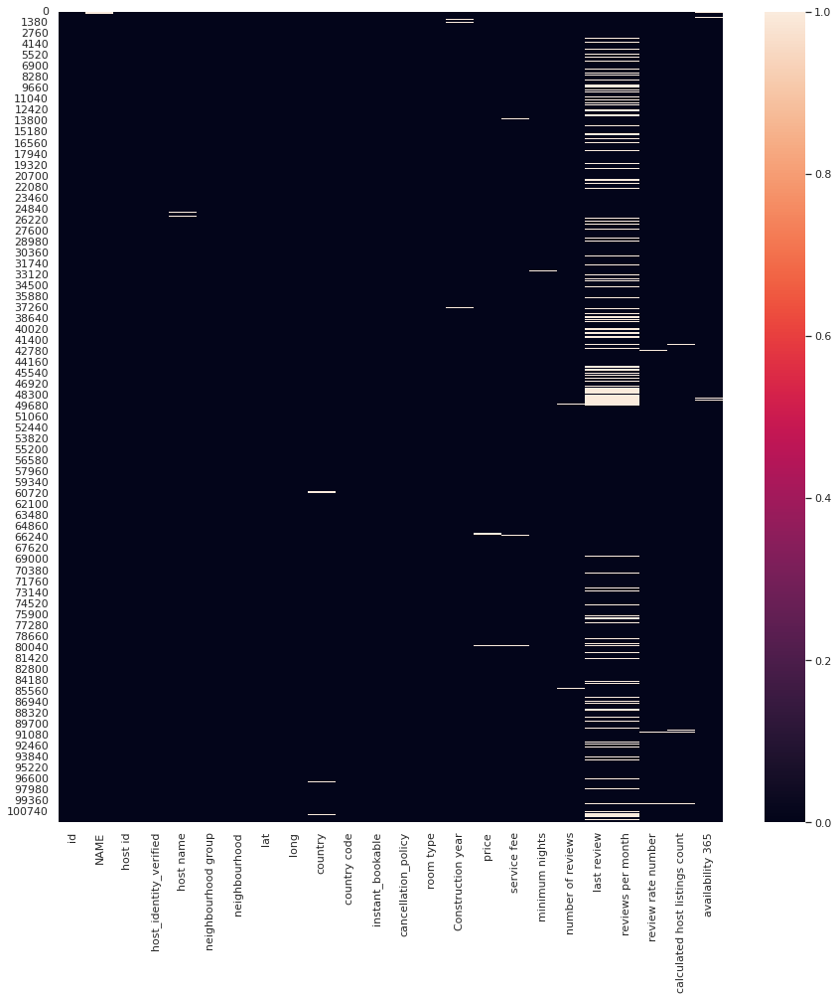

In [20]:
sns.heatmap(airbnb.isnull())

In [21]:
airbnb.shape

(102058, 24)

In [22]:
airbnb = airbnb.dropna(subset=['price','NAME','host_identity_verified'])
airbnb = airbnb.dropna(subset=['neighbourhood group','neighbourhood'])
airbnb = airbnb.dropna(subset=['cancellation_policy'])
airbnb = airbnb.dropna(subset=['instant_bookable', 'host name','Construction year'])
airbnb = airbnb.dropna(subset=['lat','long'])

In [23]:
airbnb.shape

(100595, 24)

#### 247 row deleted from price 
#### 250 row deleted from name 
#### 273 row deleted from host identity verified 
#### 29 row deleted from neighbourhood group
#### 76 row deleted from cancellation policy
#### 105 row deleted from instant bookable
#### 182 row deleted from Construction year  
#### 390 row deleted from host name                           
#### 14 row deleted from neighbourhood    
#### 7 row deleted from lat & long 
### Total rows deleted --> 1,442

In [24]:
# Drop columns where value counts is equal to 1
for col in airbnb.columns:
    if airbnb[col].value_counts().shape[0] == 1:
        airbnb = airbnb.drop(col, axis=1)

In [25]:
# Fill null values in service fee by zeros 
airbnb['service fee'] = airbnb['service fee'].fillna(0)

In [26]:
airbnb['service fee']

0         193.0
1          28.0
4          41.0
5         115.0
7         212.0
          ...  
102037      0.0
102038      0.0
102039      0.0
102040    196.0
102057      0.0
Name: service fee, Length: 100595, dtype: float64

In [27]:
airbnb['availability 365'].describe()

count    100206.000000
mean        141.069108
std         135.416654
min         -10.000000
25%           3.000000
50%          96.000000
75%         268.000000
max        3677.000000
Name: availability 365, dtype: float64

In [28]:
# remove availability 365 that less than 0 
airbnb['availability 365'] = np.where(airbnb['availability 365']<0, airbnb['availability 365']*-1, airbnb['availability 365'])

In [29]:
# remove availability 365 that more than 365
airbnb['availability 365'] = np.where(airbnb['availability 365']>365, 365, airbnb['availability 365'])

In [30]:
# remove minimum nights that less than 0 
airbnb['minimum nights'] = np.where(airbnb['minimum nights']<0, airbnb['minimum nights']*-1, airbnb['minimum nights'])

In [31]:
airbnb['availability 365'].describe()

count    100206.000000
mean        140.259785
std         133.409581
min           0.000000
25%           4.000000
50%          96.000000
75%         268.000000
max         365.000000
Name: availability 365, dtype: float64

In [32]:
#rename neighbourhood group for use in delete value 
airbnb.rename(columns = {'neighbourhood group':'neighbourhood_group'}, inplace = True)

In [33]:
# remove the row that neighbourhood group is brookln (out lier)
airbnb = airbnb[airbnb.neighbourhood_group != 'brookln']

In [34]:
airbnb.isnull().sum().sort_values()

id                                    0
service fee                           0
price                                 0
Construction year                     0
room type                             0
instant_bookable                      0
long                                  0
cancellation_policy                   0
neighbourhood                         0
neighbourhood_group                   0
host name                             0
host_identity_verified                0
host id                               0
NAME                                  0
lat                                   0
number of reviews                   181
review rate number                  279
calculated host listings count      310
minimum nights                      374
availability 365                    389
reviews per month                 15605
last review                       15611
dtype: int64

In [35]:
airbnb.head()

,id,NAME,host id,host_identity_verified,host name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,Construction year,price,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,...,2020.0,966.0,193.0,10.0,9.0,2021-10-19,0.21,4.0,6.0,286.0
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,...,2007.0,142.0,28.0,30.0,45.0,2022-05-21,0.38,4.0,2.0,228.0
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,False,...,2009.0,204.0,41.0,10.0,9.0,2018-11-19,0.10,3.0,1.0,289.0
5,1004098,Large Cozy 1 BR Apartment In Midtown East,45498551794,verified,Michelle,Manhattan,Murray Hill,40.74767,-73.97500,True,...,2013.0,577.0,115.0,3.0,74.0,2019-06-22,0.59,3.0,1.0,365.0
7,1005202,BlissArtsSpace!,90821839709,unconfirmed,Emma,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,False,...,2009.0,1060.0,212.0,45.0,49.0,2017-10-05,0.40,5.0,1.0,219.0


# 5. EDA

## 1. host identity varified

In [36]:
feature = 'host_identity_verified'

### What is the number of verification and non-verification of the identity of the host ?

In [37]:
airbnb['host_identity_verified'].value_counts()

unconfirmed    50352
verified       50242
Name: host_identity_verified, dtype: int64

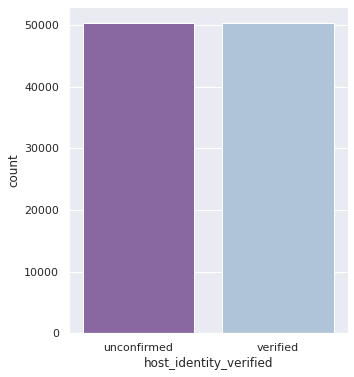

In [38]:
plt.figure(figsize=(5,6))
plt.xlabel("feature: {}".format(feature))
sns.countplot(data=airbnb, x='host_identity_verified', palette='BuPu_r')
plt.show()

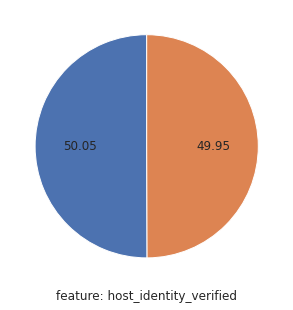

In [39]:
plt.figure(figsize=(5,6))
plt.xlabel("feature: {}".format(feature))
plt.pie(airbnb['host_identity_verified'].value_counts()*100/len(airbnb), autopct='%.2f', startangle=90)
plt.show()

From the shown plot , the number of verification and non-verification is very close, which causes insecurity for the guest, and we can fix this and ensure a more level of safety for the guest by working to increase the number of verification

## 2. lat & long 

### What is its geographical location on the world map?

#### Map 1 : 

In [40]:
lat_mean = airbnb['lat'].mean()
long_mean = airbnb['long'].mean()
area_lat = airbnb['lat'].groupby(airbnb['neighbourhood_group']).mean()
area_long = airbnb['long'].groupby(airbnb['neighbourhood_group']).mean()
area_lat_long= pd.concat([area_lat,area_long],axis=1)
area_lat_long = area_lat_long.values.tolist()


In [41]:
map = folium.Map(
                  # Center the map here
                  location=[lat_mean,long_mean],
                  zoom_start = 10
                )  
for point in range(0, len(area_lat_long)):
  _=folium.Marker(
                      area_lat_long[point],
                      popup = area_lat_long[point]
                      ).add_to(map)
map

All in New York City 

#### Map 2 :

In [42]:
#plot the world map for the number of listings per neighbourhood group

listings_per_neighbourhood_group = airbnb.groupby('neighbourhood_group')['neighbourhood_group'].count()
neighbourhood_group_lat_long = airbnb.groupby('neighbourhood_group')[['lat', 'long']].mean()
fig = px.scatter_mapbox(neighbourhood_group_lat_long,
            lat=neighbourhood_group_lat_long['lat'],
            lon=neighbourhood_group_lat_long['long'],
            hover_name=neighbourhood_group_lat_long.index,
            hover_data={'lat': False, 'long': False},
            color_discrete_sequence=px.colors.sequential.Plasma,
            size=listings_per_neighbourhood_group.values,
            size_max=15,
            zoom=10,
            title='Number of listings per neighbourhood group',
            template='plotly_dark'
)

fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(font=dict(size=20, color='white', family='Avenir'))
fig.show()

#### Map 3 : 

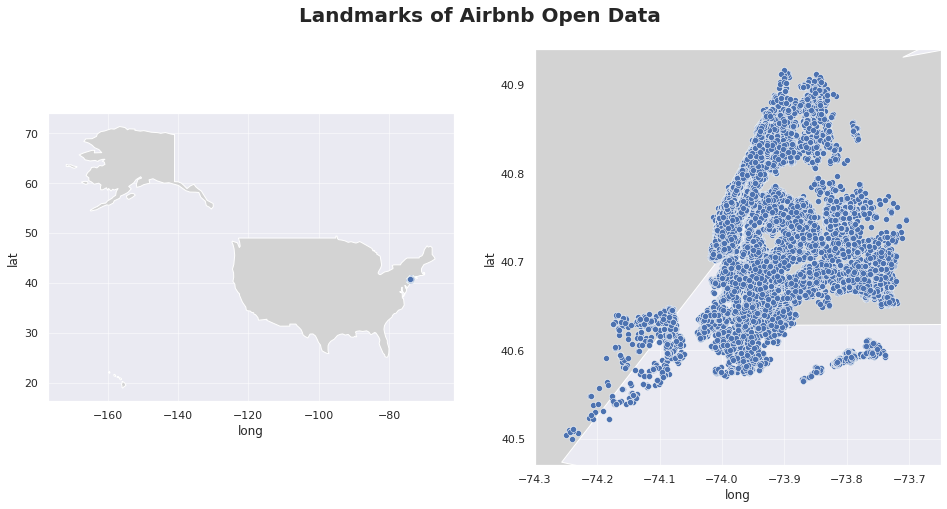

In [43]:
# visualize the land marks on the world map

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(16,16))

countries = gpd.read_file(
     gpd.datasets.get_path("naturalearth_lowres")
)

countries[countries["name"] == "United States of America"].plot(color="lightgrey", ax=ax[0])
countries[countries["name"] == "United States of America"].plot(color="lightgrey", ax=ax[1])

sns.scatterplot(x = "long", y = "lat", data = airbnb, ax = ax[0])
sns.scatterplot(x = "long", y = "lat", data = airbnb, ax = ax[1])
ax[0].grid(visible=True, alpha=0.5)
ax[1].grid(visible=True, alpha=0.5)
ax[1].set_xlim([-74.3, -73.65])
ax[1].set_ylim([40.47, 40.94])

plt.suptitle("Landmarks of Airbnb Open Data", x = 0.5, y = 0.72, fontweight = "bold", fontsize = 20)
plt.show()

## 3. Number of reviews

In [44]:
airbnb['number of reviews'].describe()

count    100413.000000
mean         27.378766
std          49.374220
min           0.000000
25%           1.000000
50%           7.000000
75%          30.000000
max        1024.000000
Name: number of reviews, dtype: float64

In [45]:
top_25_reviewed_neighbourhoods = airbnb.groupby(['neighbourhood'])['number of reviews'].sum().sort_values(ascending=False)[0:24]
print(top_25_reviewed_neighbourhoods)

neighbourhood
Bedford-Stuyvesant           267046.0
Williamsburg                 185310.0
Harlem                       174755.0
Bushwick                     121850.0
Hell's Kitchen               108868.0
East Village                  94920.0
Crown Heights                 87774.0
East Harlem                   80553.0
Upper West Side               76030.0
Upper East Side               68745.0
Chelsea                       57353.0
Midtown                       54653.0
Lower East Side               52008.0
Astoria                       49432.0
Greenpoint                    42960.0
East Elmhurst                 42481.0
Flushing                      40708.0
Washington Heights            38288.0
East Flatbush                 34947.0
Prospect-Lefferts Gardens     34931.0
Park Slope                    32479.0
West Village                  32280.0
Clinton Hill                  32163.0
Jamaica                       32123.0
Name: number of reviews, dtype: float64


### Who is Top 25 most reviewed neighbourhoods ?

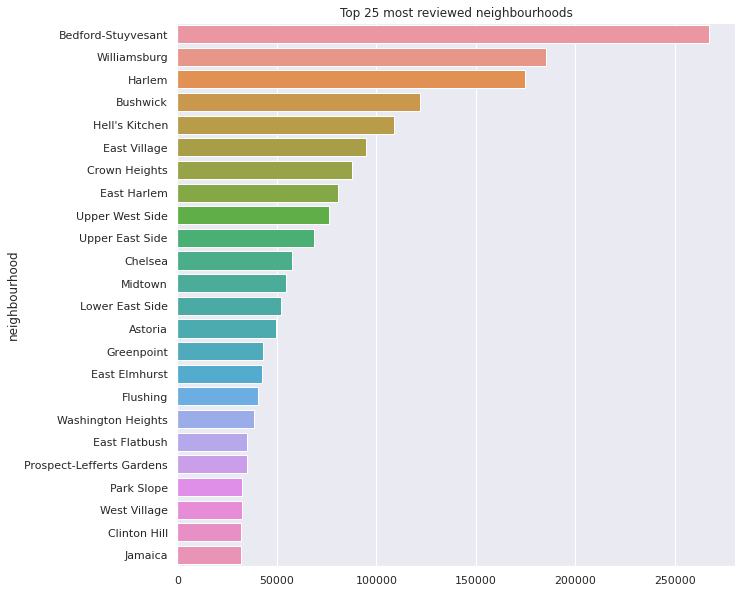

In [46]:
plt.figure(figsize=(10,10))
plt.title("Top 25 most reviewed neighbourhoods")
sns.barplot(x=top_25_reviewed_neighbourhoods.values,y=top_25_reviewed_neighbourhoods.index)
plt.show()

Bedford – Stuyvesant is top 1 

### 4 . availability 365

In [47]:
airbnb['availability 365'].describe()

count    100205.000000
mean        140.260716
std         133.409921
min           0.000000
25%           4.000000
50%          96.000000
75%         268.000000
max         365.000000
Name: availability 365, dtype: float64

### How many days do the owners of the house receive the guest in their house throughout the year ?

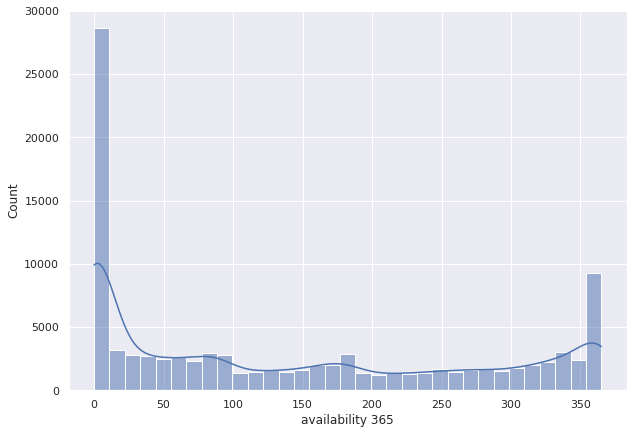

In [48]:
plt.figure(figsize=(10,7))
sns.histplot(data=airbnb, x='availability 365', kde=True)
plt.show()

0 and 365 day is the most 

In [49]:
# make groups every 3 months 
airbnb['availability_grp'] = np.where(airbnb['availability 365']<=90, '0-3 Months',
                   np.where((airbnb['availability 365'] > 9) & (airbnb['availability 365'] <= 180), '3-6 Months',
                   np.where((airbnb['availability 365'] > 180) & (airbnb['availability 365'] <= 270), '6-9 Months', '9-12 Months')))

In [50]:
airbnb['availability_grp'].value_counts()

0-3 Months     49186
9-12 Months    25041
3-6 Months     14666
6-9 Months     11701
Name: availability_grp, dtype: int64

#### What is the most available set of dates of the year ?

<AxesSubplot:ylabel='availability_grp'>

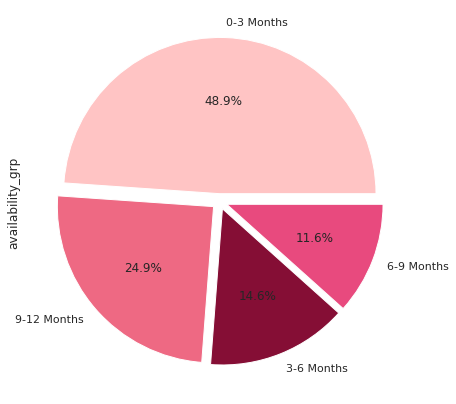

In [51]:
round(airbnb['availability_grp'].value_counts()/ airbnb.shape[0]*100,2).plot.pie(autopct = '%1.1f%%',figsize =(7, 10),explode=(0.05,0.05,0.05,0.05),colors=['#FFC4C4','#EE6983','#850E35','#e84a7e'])

from 0-3 months is the most 

### What is the average availability for each neighbourhood group?

In [52]:
availability_per_neighbourhood_group = airbnb.groupby('neighbourhood_group')['availability 365'].mean()
fig = px.bar(availability_per_neighbourhood_group,
            x=availability_per_neighbourhood_group.index,
            y=availability_per_neighbourhood_group.values,
            labels={'x': 'Neighbourhood group', 'y': 'Average availability'},
            text=[str(round(i)) for i in availability_per_neighbourhood_group.values],
            title='Average availability per neighbourhood group',
            color_discrete_sequence=px.colors.sequential.deep,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=20, color='white', family='Avenir'))

fig.show()

Brooklyn is the most popular listing, followed by Manhattan. It seems that Staten Island are the least popular listings. . So that we can make offers on it

## 5. review rate number

In [53]:
avg_rating_per_neighbourhood = airbnb.groupby(['neighbourhood'])['review rate number'].mean().sort_values(ascending=False)[0:24]
print(avg_rating_per_neighbourhood)

neighbourhood
Glen Oaks             4.500000
Co-op City            4.400000
Gerritsen Beach       4.333333
Huguenot              4.111111
Eltingville           4.000000
West Farms            4.000000
Todt Hill             4.000000
Silver Lake           4.000000
Woodrow               4.000000
Rosebank              3.928571
Bull's Head           3.916667
Little Neck           3.875000
Oakwood               3.857143
Clifton               3.820513
Mill Basin            3.785714
Arden Heights         3.777778
Mount Eden            3.777778
Grymes Hill           3.722222
City Island           3.707317
Randall Manor         3.704545
Unionport             3.666667
Westchester Square    3.652174
Stapleton             3.650794
South Beach           3.642857
Name: review rate number, dtype: float64


### Which neighbourhood do you give the highest ratings to?

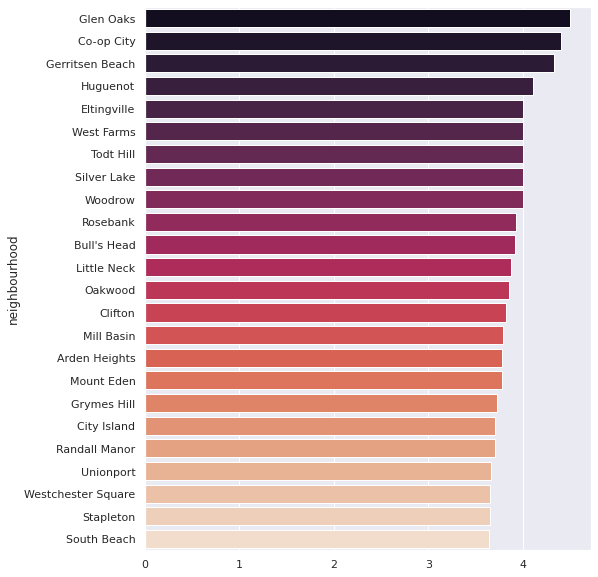

In [54]:
plt.figure(figsize=(8,10))
sns.barplot(x=avg_rating_per_neighbourhood.values, y=avg_rating_per_neighbourhood.index, palette='rocket')
plt.show()

 Glen Oaks

## 6. Price 

### What is the range of prices ?


In [55]:
airbnb['price'].describe()

count    100594.000000
mean        625.371275
std         331.651913
min          50.000000
25%         340.000000
50%         625.000000
75%         913.000000
max        1200.000000
Name: price, dtype: float64

<AxesSubplot:xlabel='price', ylabel='Count'>

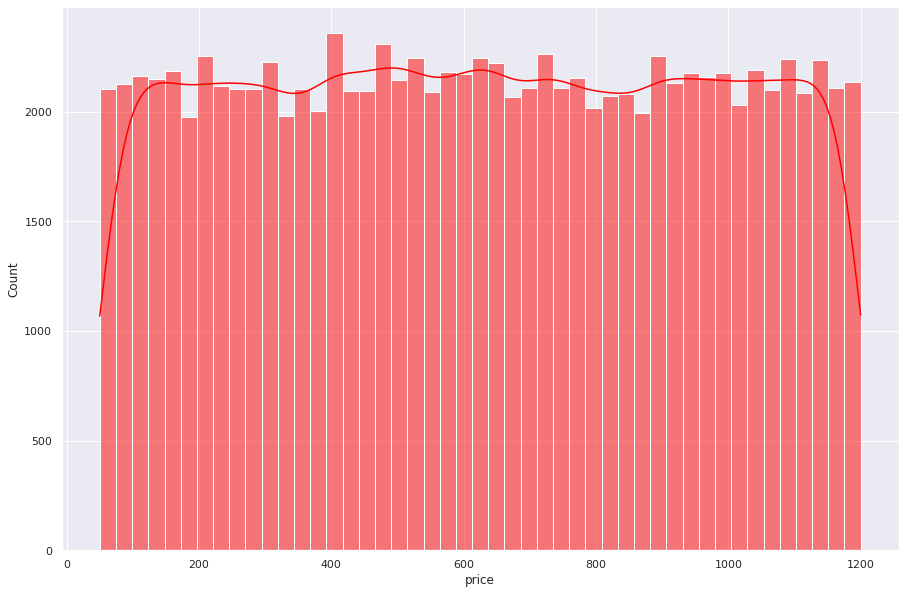

In [56]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=2)
sns.histplot(data=airbnb, x="price", kde=True, color = "red")

Prices range from 50 to 1200 dollars

### Is host identity verified effect on price ?

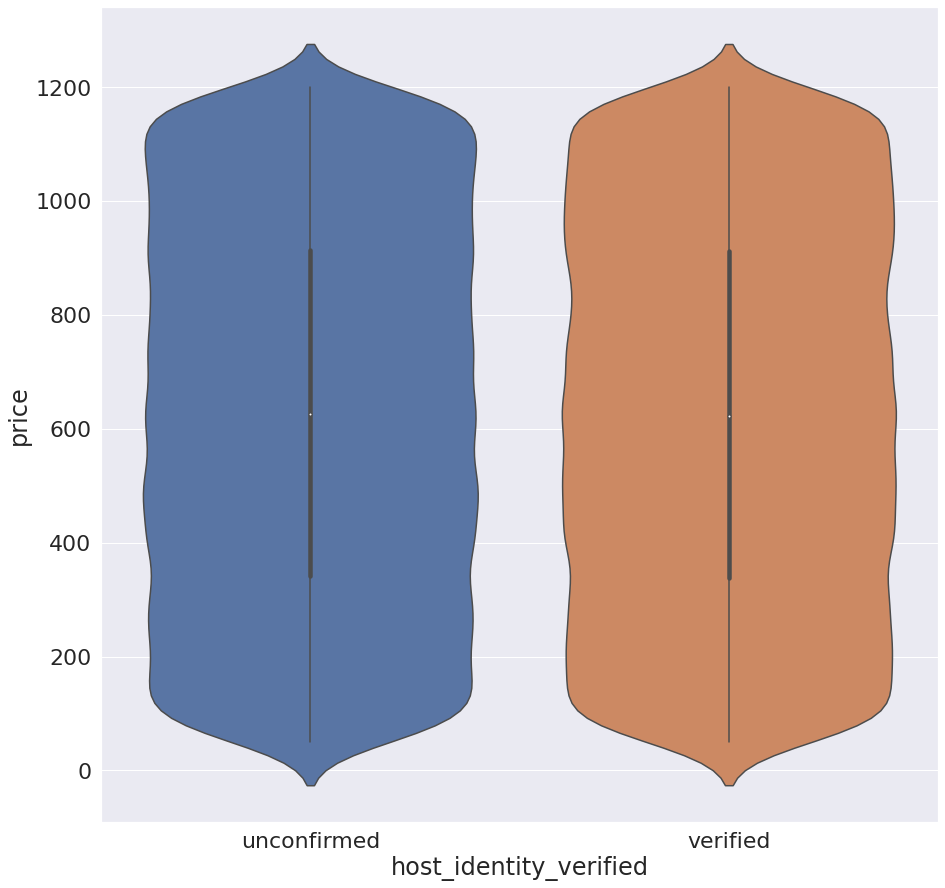

In [57]:
ax = sns.violinplot(x="host_identity_verified", y="price", data=airbnb)

No , the same 

### What is the relationship with neighbourhood group and the price ?

<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

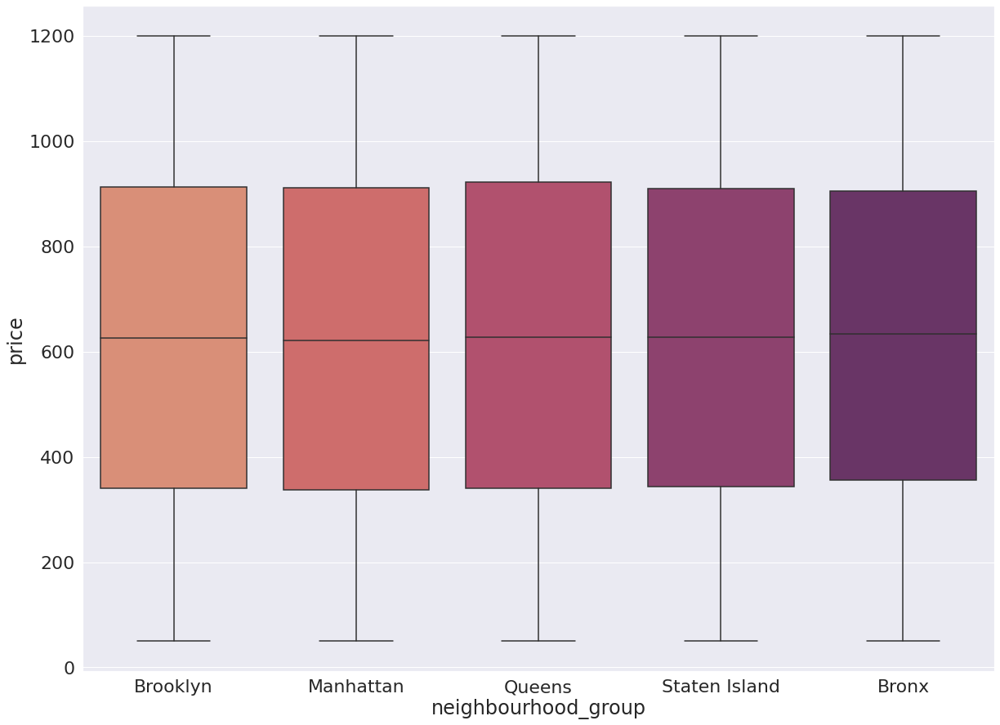

In [58]:
fig, ax = plt.subplots(figsize=(20, 15))
sns.set(font_scale=2)
sns.boxplot(x="neighbourhood_group", y="price", data=airbnb,palette="flare")

There is no big difference between the neighbourhood group and after them compared to the price, so it is almost the same price range

### What are the average price for each room type?


In [59]:
price_per_room_type = airbnb.groupby('room type')['price'].median()
fig = px.bar(price_per_room_type,
            x=price_per_room_type.index,
            y=price_per_room_type.values,
            labels={'x': 'Room type', 'y': 'Average price'},
            text=['$' + str(int(i)) for i in price_per_room_type.values],
            title='Average price per room type in USD',
            color_discrete_sequence=px.colors.sequential.Bluyl,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=16, color='white', family='Avenir'))

fig.show()

The average price per night is $600 for all types 

### Is the later construction year correlated with higher price?


In [60]:
price_per_year = airbnb.groupby('Construction year')['price'].median()
fig = px.line(price_per_year,
            x=price_per_year.index,
            y=price_per_year.values,
            labels={'x': 'Construction year', 'y': 'Average price'},
            text=['$' + str(int(i)) for i in price_per_year.values],
            title='Average price per construction year in USD',
            color_discrete_sequence=px.colors.sequential.Teal_r,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=16, color='white', family='Avenir'))

fig.show()


As we can see above, the average price managed to stay between  600and 620 per night, but there are some outliers that are way above that price...

### What is prices depends on neighbourhood group by map ?

In [61]:
fig = px.scatter_mapbox(airbnb,lat="lat",
           lon="long",
           opacity = 0.3,
           hover_name="neighbourhood_group",
           hover_data=["neighbourhood_group", "price"],
           color="price",
           color_discrete_sequence=px.colors.sequential.PuBuGn,
           title = "Price comparing to the place",
           template = "plotly_dark",
           zoom=10
           )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},font = dict(size=17,family="Franklin Gothic"))
fig.show()

## 7. type of rooms 

In [62]:
airbnb['room type'].value_counts()

Entire home/apt    52691
Private room       45606
Shared room         2182
Hotel room           115
Name: room type, dtype: int64

### What are the proportions of room types?

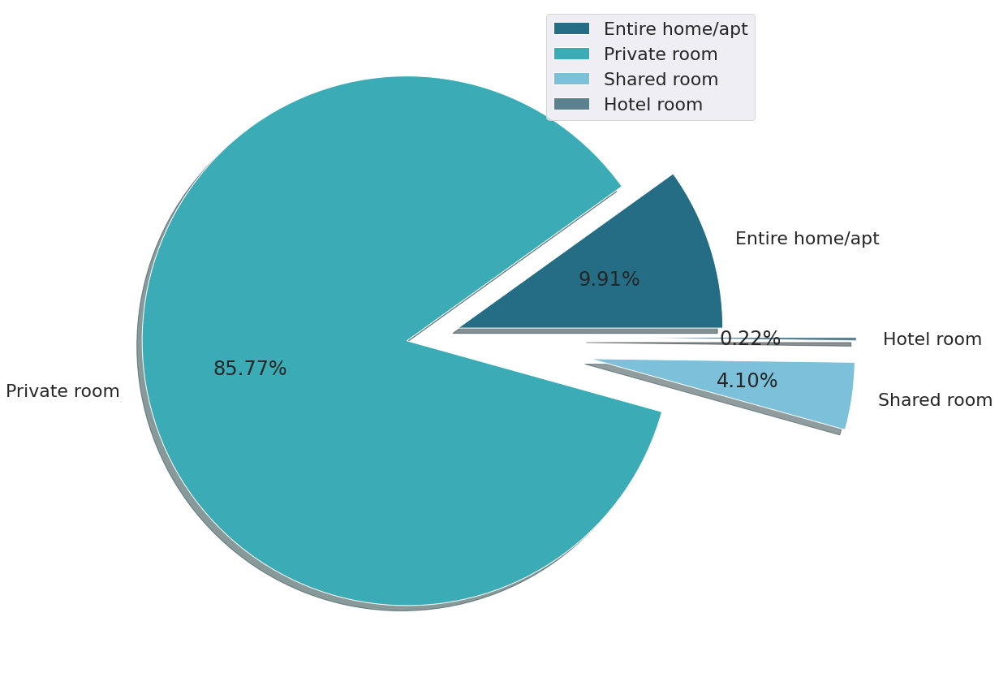

In [63]:
plt.figure(figsize= (15, 15))
data  = [5269,45606,2182,115]
labels = ["Entire home/apt", "Private room","Shared room","Hotel room"]
explode = [0.1,0.1,0.6,0.6]
plt.pie(data ,labels= labels , explode = explode , autopct="%1.2f%%", shadow= True, colors= ['#256D85', '#3BACB6','#7cc1d9','#5d828f'])
plt.legend()
plt.show()

Private rooms get the largest percentage

### Map on room types

In [64]:
fig = px.scatter_mapbox(airbnb,
           lat="lat",
           lon="long",
           opacity = 0.3,
           hover_name="neighbourhood_group",
           hover_data=["neighbourhood_group", "room type"],
           color="room type",
            color_discrete_sequence=px.colors.qualitative.Dark24,
           title = "Price comparing to the place",
           template = "plotly_dark",
           zoom=10
           )
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},font = dict(size=17,family="Franklin Gothic"))
fig.show()

## 8. Construction year

### What is the most Construction year ?

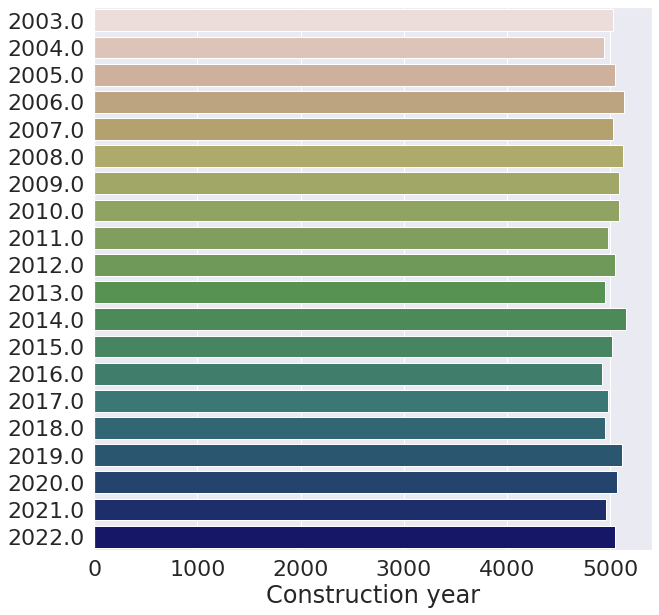

In [65]:
plt.figure(figsize=(10,10))
plt.xlabel("feature: {}".format(feature))
sns.barplot(y=airbnb['Construction year'].value_counts().index, 
            x=airbnb['Construction year'].value_counts(), palette="gist_earth_r", orient='h')
plt.show()

### How many constructions are there for each year?

In [66]:
constructions_per_year = airbnb.groupby('Construction year')['Construction year'].count()

# Let's plot them using plotly's barplot with value counts
fig = px.bar(constructions_per_year, 
            x=constructions_per_year.index, 
            y=constructions_per_year.values, 
            labels={'x': 'Construction year', 'y': 'Number of constructions'},
            text=[str(i) for i in constructions_per_year.values],
            title='Number of constructions per year',
            template='plotly_dark'
)

fig.update_layout(font=dict(size=20, color='white', family='Avenir'))

fig.show()

It looks like there are about ~4,000 constructions per year on the dataset...

### What are the price ranges for each construction year?

In [67]:
fig = px.bar(price_per_year,
            x=price_per_year.index,
            y=price_per_year.values,
            labels={'x': 'Construction year', 'y': 'Average price'},
            text=['$' + str(int(i)) for i in price_per_year.values],
            title='Average price per construction year in USD',
            color_discrete_sequence=px.colors.sequential.RdBu,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=16, color='white', family='Avenir'))

fig.show()



An average of $600 per night...

## 9. neighbourhood group

### Who is main neighbourhood group ?

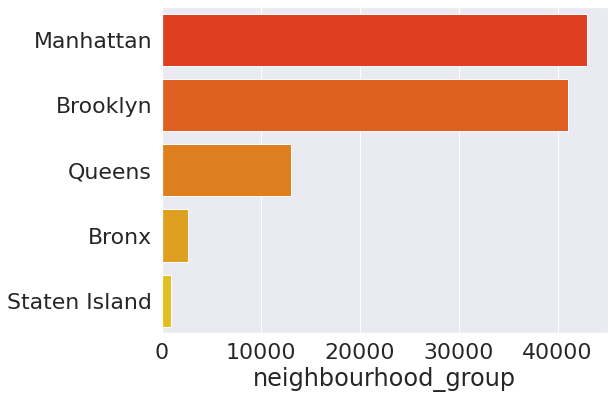

In [68]:
plt.figure(figsize=(8,6))
plt.xlabel("feature: {}".format(feature))
sns.barplot(x=airbnb['neighbourhood_group'].value_counts(), 
            y=airbnb['neighbourhood_group'].value_counts().index, palette="autumn")
plt.show()

In [69]:
def readable_format(num: int) -> str:
    """
    Convert any number type into comma format values
   
    Example: 1000000 -> 1,000,000
    """
    num = float('{:.3g}'.format(num))
    i = 0

    while abs(num) >= 1000:
        i += 1
        num /= 1000.0

    return '{}{}'.format('{:f}'.format(num).rstrip('0').rstrip('.'), ['', 'K', 'M', 'B', 'T'][i])

### How many listings are there for each neighbourhood group?


In [70]:
fig = px.bar(listings_per_neighbourhood_group,
            x=listings_per_neighbourhood_group.index,
            y=listings_per_neighbourhood_group.values,
            labels={'x': 'neighbourhood_group', 'y': 'Number of listings'},
            text=[readable_format(i) for i in listings_per_neighbourhood_group.values],
            title='Number of listings per neighbourhood group',
            color_discrete_sequence=px.colors.sequential.Agsunset,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=20, color='white', family='Avenir'))

fig.show()

It seems that most of the listings came from Brooklyn and Manhattan...

### What are the average service fee for each neighbourhood group?


In [71]:
service_fee_per_neighbourhood_group = airbnb.groupby('neighbourhood_group')['service fee'].mean()
fig = px.bar(service_fee_per_neighbourhood_group,
            x=service_fee_per_neighbourhood_group.index,
            y=service_fee_per_neighbourhood_group.values,
            labels={'x': 'Neighbourhood_group', 'y': 'Average service fee'},
            text=['$' + str(int(i)) for i in service_fee_per_neighbourhood_group.values],
            title='Average service fee per neighbourhood group in USD',
            color_discrete_sequence=px.colors.sequential.Plasma,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=16, color='white', family='Avenir'))

fig.show()

The average service fee is about $125 across neighborhoods...

### What are the average review rates for each neighbourhood group?


In [72]:
review_rate_per_neighbourhood_group = airbnb.groupby('neighbourhood_group')['review rate number'].mean()

# Let's plot them using plotly's barplot with value counts
fig = px.bar(review_rate_per_neighbourhood_group,
            x=review_rate_per_neighbourhood_group.index,
            y=review_rate_per_neighbourhood_group.values,
            labels={'x': 'Neighbourhood group', 'y': 'Average review rate'},
            text=[str(round(i, 2)) for i in review_rate_per_neighbourhood_group.values],
            title='Average review rate per neighbourhood group',
            color_discrete_sequence=px.colors.sequential.algae,
            template='plotly_dark'
)

fig.update_layout(font=dict(size=20, color='white', family='Avenir'))

fig.show()

The average rating across each neighborhood is about 3.3...

## 10. Host name 

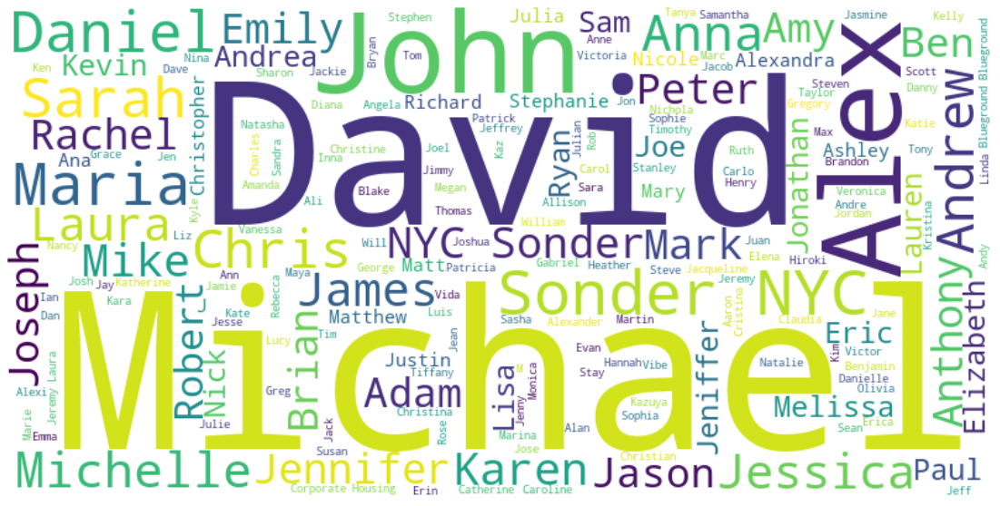

In [73]:
host_names = airbnb['host name'].values
wordcloud = WordCloud(background_color='white', width=800, height=400).generate(' '.join(host_names))
plt.figure(figsize=(20, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

It can be seen that Michael, David, and John are the most popular hosts names...

## 11. service fee

In [74]:
airbnb['service fee'].describe()

count    100594.000000
mean        124.770642
std          66.521027
min           0.000000
25%          68.000000
50%         125.000000
75%         182.000000
max         240.000000
Name: service fee, dtype: float64

<AxesSubplot:xlabel='service fee', ylabel='Count'>

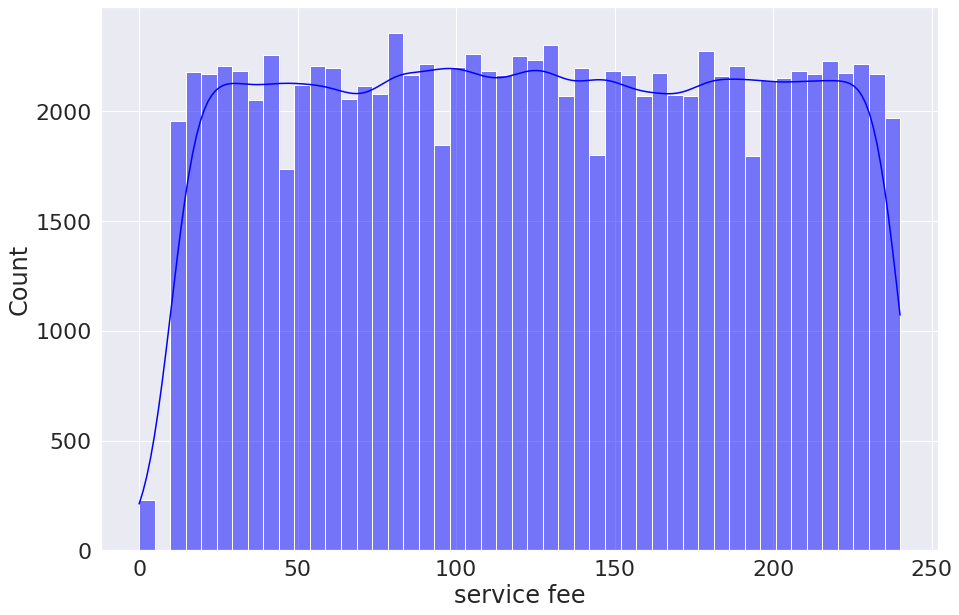

In [75]:
fig, ax = plt.subplots(figsize=(15, 10))
sns.set(font_scale=2)
sns.histplot(data=airbnb, x="service fee", kde=True, color = "blue")

Service fee range from 0 to 240 dollars

## 12. neighbourhood

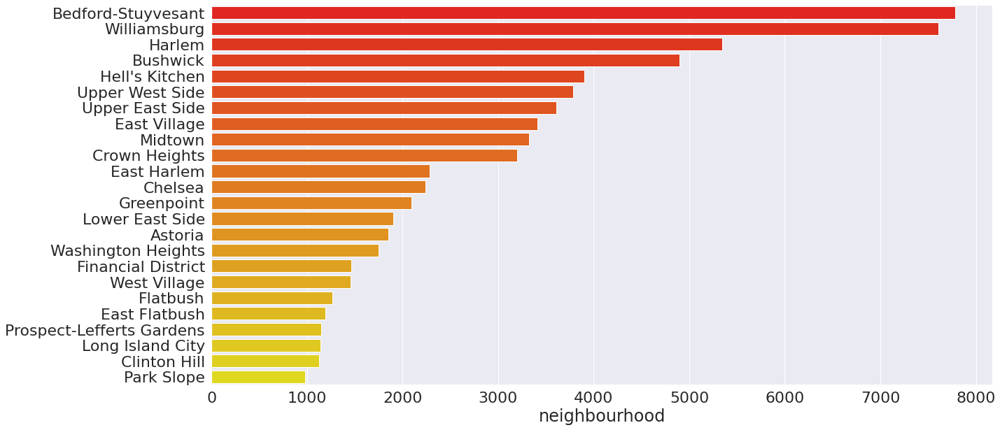

In [76]:
plt.figure(figsize=(20,10))
plt.xlabel("feature: {}".format(feature))
sns.barplot(x=airbnb['neighbourhood'].value_counts()[0:24], 
            y=airbnb['neighbourhood'].value_counts().index[0:24], palette="autumn")
plt.show()

# 6. Encoding & split Data

### deal with nulls value by fill with mean and medium 

In [77]:
airbnb["reviews per month"].fillna(airbnb["reviews per month"].mean(),inplace=True)
airbnb["minimum nights"].fillna(airbnb["minimum nights"].mean(),inplace=True)
airbnb["availability 365"].fillna(airbnb["availability 365"].mean(),inplace=True)
airbnb["calculated host listings count"].fillna(airbnb["calculated host listings count"].mean(),inplace=True)
airbnb["number of reviews"].fillna(airbnb["number of reviews"].median(), inplace=True)
airbnb["review rate number"].fillna(airbnb["review rate number"].median(), inplace=True)

In [78]:
# fills null date 
num_days = 10
g = airbnb['last review'].notna().cumsum()
days = pd.to_timedelta(airbnb.groupby(g).cumcount().mul(num_days), unit='d')
airbnb['last review'] = airbnb['last review'].ffill().add(days)

In [79]:
airbnb.isnull().sum().sort_values()

id                                0
calculated host listings count    0
review rate number                0
reviews per month                 0
last review                       0
number of reviews                 0
minimum nights                    0
service fee                       0
price                             0
Construction year                 0
availability 365                  0
room type                         0
instant_bookable                  0
long                              0
lat                               0
neighbourhood                     0
neighbourhood_group               0
host name                         0
host_identity_verified            0
host id                           0
NAME                              0
cancellation_policy               0
availability_grp                  0
dtype: int64

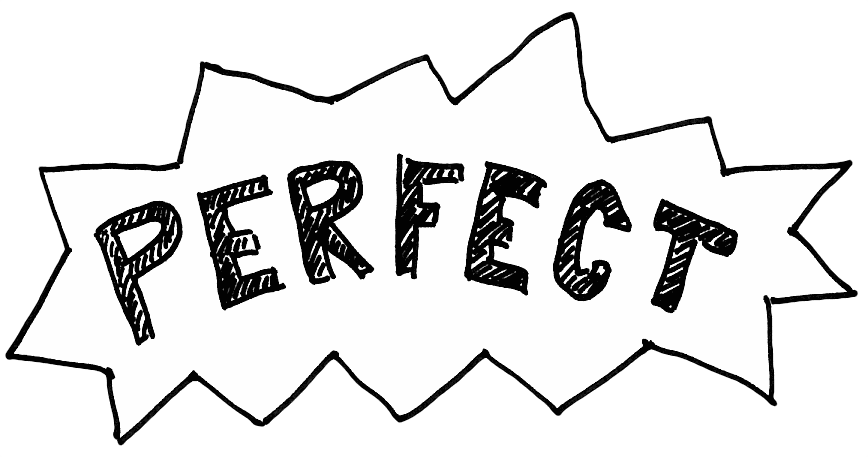

### Encode

In [80]:
airbnb['host_identity_verified'].value_counts()

unconfirmed    50352
verified       50242
Name: host_identity_verified, dtype: int64

In [81]:
le = LabelEncoder()
host_identity_verified_le = LabelEncoder()
airbnb['host_identity_verified'] = host_identity_verified_le.fit_transform(airbnb['host_identity_verified'])

In [82]:
airbnb['host_identity_verified'].value_counts()
# unconfirmed --> 0 , verified --> 1

0    50352
1    50242
Name: host_identity_verified, dtype: int64

In [83]:
airbnb['instant_bookable'].value_counts()

False    50508
True     50086
Name: instant_bookable, dtype: int64

In [84]:
le = LabelEncoder()
instant_bookable_le = LabelEncoder()
airbnb['instant_bookable'] = instant_bookable_le.fit_transform(airbnb['instant_bookable'])
airbnb['instant_bookable'].value_counts()
# False --> 0 , True --> 1 

0    50508
1    50086
Name: instant_bookable, dtype: int64

In [85]:
airbnb.select_dtypes('object')

,NAME,host name,neighbourhood_group,neighbourhood,cancellation_policy,room type,availability_grp
0,Clean & quiet apt home by the park,Madaline,Brooklyn,Kensington,strict,Private room,9-12 Months
1,Skylit Midtown Castle,Jenna,Manhattan,Midtown,moderate,Entire home/apt,6-9 Months
4,Entire Apt: Spacious Studio/Loft by central park,Lyndon,Manhattan,East Harlem,moderate,Entire home/apt,9-12 Months
5,Large Cozy 1 BR Apartment In Midtown East,Michelle,Manhattan,Murray Hill,flexible,Entire home/apt,9-12 Months
7,BlissArtsSpace!,Emma,Brooklyn,Bedford-Stuyvesant,moderate,Private room,6-9 Months
...,...,...,...,...,...,...,...
102037,Bx Apartment,Vii,Bronx,Olinville,strict,Private room,0-3 Months
102038,HUGE BEDROOM LORIMER L TRAIN!!!,Jose,Brooklyn,Williamsburg,flexible,Private room,6-9 Months
102039,Spacious two bedrooms condo in upper Manhattan,Max,Manhattan,Inwood,moderate,Entire home/apt,3-6 Months
102040,"Room in Queens, NY, near LGA.",Sonia,Queens,East Elmhurst,strict,Private room,9-12 Months


In [86]:
airbnb['cancellation_policy'].value_counts()

moderate    33708
strict      33478
flexible    33408
Name: cancellation_policy, dtype: int64

In [87]:
le = LabelEncoder()
cancellation_policy_le = LabelEncoder()
airbnb['cancellation_policy'] = cancellation_policy_le.fit_transform(airbnb['cancellation_policy'])
airbnb['cancellation_policy'].value_counts()
# moderate --> 1 , strict --> 2 , flexible --> 0

1    33708
2    33478
0    33408
Name: cancellation_policy, dtype: int64

In [88]:
airbnb['room type'].value_counts()

Entire home/apt    52691
Private room       45606
Shared room         2182
Hotel room           115
Name: room type, dtype: int64

In [89]:
le = LabelEncoder()
room_type_le = LabelEncoder()
airbnb['room type'] = room_type_le.fit_transform(airbnb['room type'])
airbnb['room type'].value_counts()
# Hotel room --> 1 , Private room --> 2 , Entire home/apt --> 0 , Shared room --> 3

0    52691
2    45606
3     2182
1      115
Name: room type, dtype: int64

In [90]:
airbnb['neighbourhood_group'].value_counts()

Manhattan        42943
Brooklyn         41017
Queens           13043
Bronx             2658
Staten Island      933
Name: neighbourhood_group, dtype: int64

In [91]:
airbnb['neighbourhood_group'].value_counts()

Manhattan        42943
Brooklyn         41017
Queens           13043
Bronx             2658
Staten Island      933
Name: neighbourhood_group, dtype: int64

In [92]:
le = LabelEncoder()
neighbourhood_group_le = LabelEncoder()
airbnb['neighbourhood_group'] = neighbourhood_group_le.fit_transform(airbnb['neighbourhood_group'])
airbnb['neighbourhood_group'].value_counts()
# Brooklyn --> 1 , Manhattan --> 2 , Bronx --> 0 , Queens --> 3 , Staten Island --> 4 

2    42943
1    41017
3    13043
0     2658
4      933
Name: neighbourhood_group, dtype: int64

In [93]:
airbnb.select_dtypes('object')

,NAME,host name,neighbourhood,availability_grp
0,Clean & quiet apt home by the park,Madaline,Kensington,9-12 Months
1,Skylit Midtown Castle,Jenna,Midtown,6-9 Months
4,Entire Apt: Spacious Studio/Loft by central park,Lyndon,East Harlem,9-12 Months
5,Large Cozy 1 BR Apartment In Midtown East,Michelle,Murray Hill,9-12 Months
7,BlissArtsSpace!,Emma,Bedford-Stuyvesant,6-9 Months
...,...,...,...,...
102037,Bx Apartment,Vii,Olinville,0-3 Months
102038,HUGE BEDROOM LORIMER L TRAIN!!!,Jose,Williamsburg,6-9 Months
102039,Spacious two bedrooms condo in upper Manhattan,Max,Inwood,3-6 Months
102040,"Room in Queens, NY, near LGA.",Sonia,East Elmhurst,9-12 Months


In [94]:
airbnb.shape

(100594, 23)

### Data Spliting

In [95]:
split_data = airbnb.copy()

###### split_data.head()

In [96]:
split_data.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood_group', 'neighbourhood', 'lat', 'long',
       'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'availability_grp'],
      dtype='object')

In [97]:
split_data = split_data[['host_identity_verified','neighbourhood_group','instant_bookable','cancellation_policy','room type','Construction year','minimum nights','number of reviews', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365','price', 'service fee']]

In [98]:
x =split_data.drop(["price"],axis=1).values
y= split_data['price'].values

In [99]:
x_train,x_test,y_train,y_test = train_test_split(x, y, test_size=0.25, random_state=42)
# 25 % --> test
# 75 % --> train 

In [100]:
ro_scaler = RobustScaler()
x_train = ro_scaler.fit_transform(x_train)
x_test = ro_scaler.fit_transform(x_test)

# 7. Modeling 

In [101]:
def plot_predictions(model, X_test, y_test):
    y_pred = model.predict(X_test)
    df = pd.DataFrame({"Y_test": y_test , "Y_pred" : y_pred})
    plt.figure(figsize=(15,8))
    plt.plot(df[:20])
    plt.legend(['Actual' , 'Predicted'])

### i. linear Regression

In [102]:
reg = linear_model.LinearRegression()
reg.fit(x_train,y_train)
regv =reg.score(x_train,y_train)
regv

0.9886161767574628

In [103]:
reg.score(x_test,y_test)

0.9877797759896411

In [104]:
reg.intercept_

626.3275298658183

In [105]:
reg.coef_

array([-1.13908260e-01,  1.28890274e-01,  1.01816211e-01, -2.12418978e-02,
        2.61975183e-01,  8.16021809e-02,  6.63039156e-02,  2.46250346e-02,
       -1.99101519e-01, -1.01558997e-02,  2.66639863e-04, -9.86215861e-02,
        5.70146773e+02])

In [106]:
pd.DataFrame(reg.coef_ , split_data.columns[:-1] , columns=['Coeficient'])

,Coeficient
host_identity_verified,-0.113908
neighbourhood_group,0.128890
instant_bookable,0.101816
cancellation_policy,-0.021242
room type,0.261975
Construction year,0.081602
minimum nights,0.066304
number of reviews,0.024625
reviews per month,-0.199102
review rate number,-0.010156


In [107]:
y_pred = reg.predict(x_test)
df = pd.DataFrame({"Y_test": y_test , "Y_pred" : y_pred})
df.head(10)

,Y_test,Y_pred
0,845.0,849.346198
1,1026.0,1028.244220
2,1081.0,1082.524671
3,870.0,874.015647
4,130.0,139.774688
5,521.0,526.790488
6,1190.0,1191.393146
7,56.0,65.709469
8,646.0,651.356443
9,1016.0,1018.142303


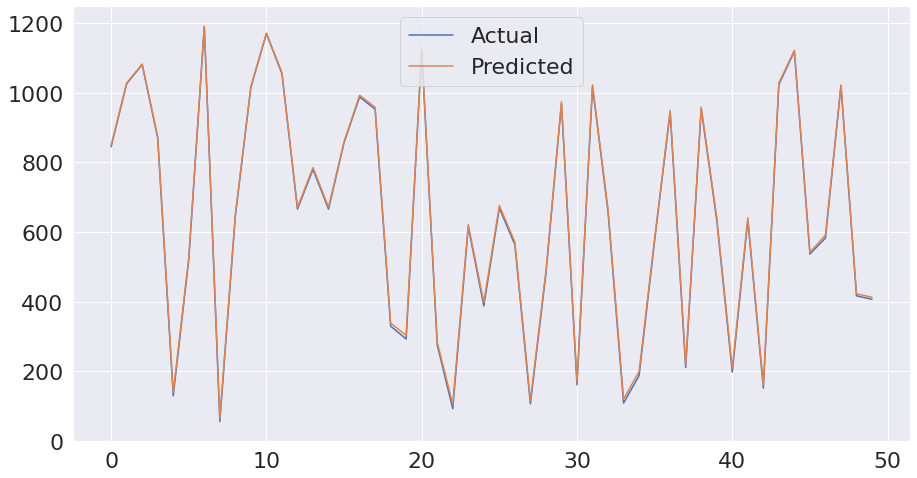

In [108]:
plt.figure(figsize=(15,8))
plt.plot(df[:50])
plt.legend(['Actual' , 'Predicted'])

### Evaluation of Linear Regression


In [109]:
reg_score = r2_score(y_test , y_pred)
reg_score

0.9877797759896411

In [110]:
p = len(x_train[0])
n = len(y_train)
adj_R2l = 1-(1-reg_score)*(n-1)/(n-p-1)
adj_R2l

0.9877776699203574

In [111]:
adj_R2l < reg_score

True

In [112]:
mse = mean_squared_error(y_test , y_pred)
mse


1343.771235932912

In [113]:
mae = mean_absolute_error(y_test , y_pred)
mae

7.964311862942465

In [114]:
mpae= mean_absolute_percentage_error(y_test,y_pred)
mpae

0.02626484510460336

In [115]:
reg_mse = mean_squared_error(y_test,y_pred)
reg_rmse= np.sqrt(reg_mse)
reg_rmse

36.65748540111436

## ii. Linear Discriminant Analysis

In [116]:
lda = LinearDiscriminantAnalysis().fit(x_train, y_train)
ldav = lda.score(x_train,y_train)
ldav

0.06720127245012923

In [117]:
lda.score(x_test , y_test)

0.02942462920990894

In [118]:
lda.intercept_


array([-138.85755991, -138.44589197, -138.41502968, ..., -138.53829017,
       -138.46382065, -141.58736823])

In [119]:
lda.coef_


array([[ 9.02532552e-02,  3.79892091e-02, -1.78621284e-01, ...,
        -4.74660750e-03,  5.16115604e-01, -2.62772514e+02],
       [ 3.28596906e-02,  1.54549135e-02, -2.24824942e-01, ...,
        -2.15129836e-03,  1.65899995e-01, -2.62593748e+02],
       [ 2.84331223e-01, -1.82864475e-01, -1.42467054e-01, ...,
        -4.48468865e-03,  4.38977955e-01, -2.62507973e+02],
       ...,
       [-5.12434039e-01, -2.43925108e-01,  4.67343536e-01, ...,
        -5.96762971e-03,  9.38049311e-02,  2.62870748e+02],
       [ 9.85363970e-02, -5.50944788e-02,  2.73788182e-02, ...,
         1.48625311e-03, -3.80494445e-01,  2.62884851e+02],
       [ 4.31221334e-01, -2.62866409e-01,  2.93139374e-01, ...,
        -5.36044497e-03,  6.37277801e-01,  2.63225072e+02]])

In [120]:
y_pred = lda.predict(x_test)
df = pd.DataFrame({"Y_test": y_test , "Y_pred" : y_pred})
df.head(10)

,Y_test,Y_pred
0,845.0,878.0
1,1026.0,1025.0
2,1081.0,1075.0
3,870.0,861.0
4,130.0,151.0
5,521.0,508.0
6,1190.0,1178.0
7,56.0,89.0
8,646.0,658.0
9,1016.0,1032.0


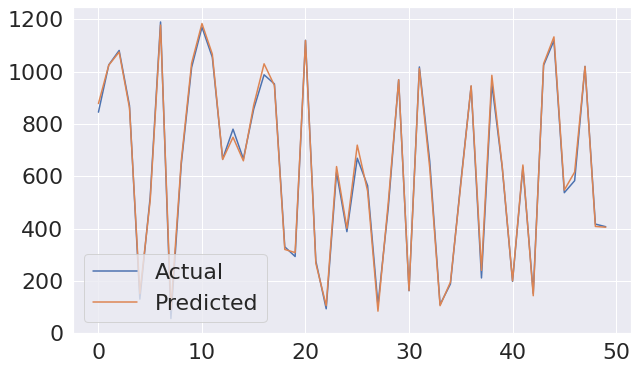

In [121]:
plt.figure(figsize=(10,6))
plt.plot(df[:50])
plt.legend(['Actual' , 'Predicted'])

#### Evaluation of Linear Discriminant Analysis


In [122]:
lda_score = r2_score(y_test , y_pred)
lda_score

0.986429102187009

In [123]:
p = len(x_train[0])
n = len(y_train)
adj_R2ld = 1-(1-lda_score)*(n-1)/(n-p-1)
adj_R2ld

0.9864267633386367

In [124]:
adj_R2ld < lda_score

True

In [125]:
mse = mean_squared_error(y_test , y_pred)
mse

1492.2952403674103

In [126]:
mae = mean_absolute_error(y_test,y_pred)
mae

15.33480456479383

In [127]:
mpae= mean_absolute_percentage_error(y_test,y_pred)
mpae

0.03925196565573252

In [128]:
reg_mse = mean_squared_error(y_test,y_pred)
reg_rmse= np.sqrt(reg_mse)
reg_rmse


38.63023738430053

## iii. Decision Tree

In [129]:
tdt = DecisionTreeRegressor().fit(x_train, y_train)
tdtv = tdt.score(x_train,y_train)
tdtv 

1.0

In [130]:
tdt.score(x_test,y_test)

0.9948462621136743

In [131]:
y_pred = tdt.predict(x_test)

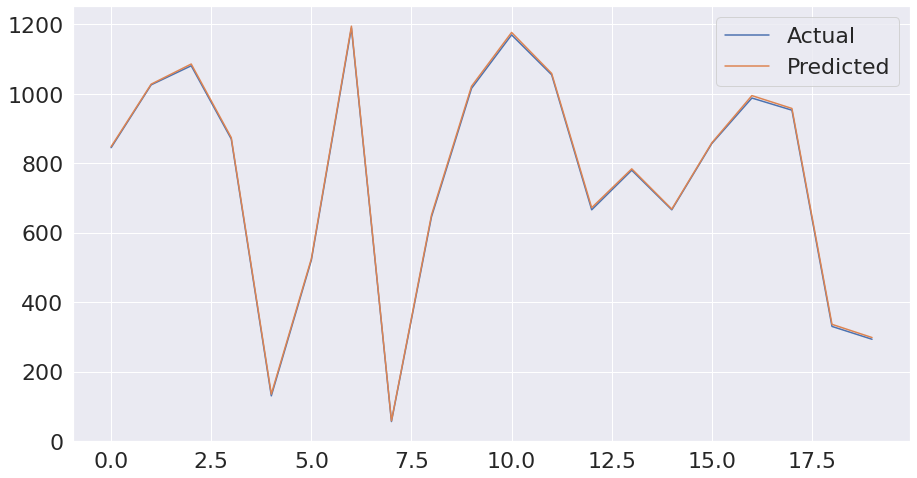

In [132]:
plot_predictions(tdt, x_test, y_test)

#### Evaluation of Decision Tree

In [133]:
tdt_score = r2_score(y_test , y_pred)
tdt_score

0.9948462621136743

In [134]:
p = len(x_train[0])
n = len(y_train)
adj_R2t = 1-(1-tdt_score)*(n-1)/(n-p-1)
adj_R2t

0.994845373903356

In [135]:
adj_R2t < tdt_score

True

In [136]:
mse = mean_squared_error(y_test , y_pred)
mse

566.7199491033441

In [137]:
mae = mean_absolute_error(y_test,y_pred)
mae

5.9569764205336195

In [138]:
mpae= mean_absolute_percentage_error(y_test,y_pred)
mpae

0.01645790360027853

In [139]:
reg_mse = mean_squared_error(y_test,y_pred)
reg_rmse= np.sqrt(reg_mse)
reg_rmse

23.805880557193092

## iv. RandomForest Regressor

In [140]:
rf = RandomForestRegressor().fit(x_train, y_train)
rfv = rf.score(x_train,y_train)
rfv

0.9996383272173088

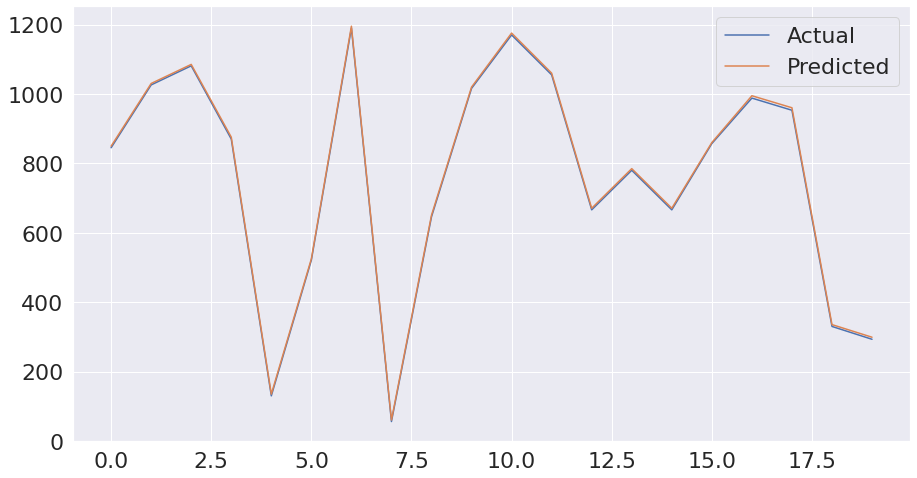

In [141]:
plot_predictions(rf, x_test, y_test)

In [142]:
print(rf.score(x_train , y_train))
print(rf.score(x_test , y_test))

0.9996383272173088
0.9969746901917229


In [143]:
y_pred = rf.predict(x_test)

### Evaluation RandomForest Regressor

In [144]:
rf_score = r2_score(y_test , y_pred)
rf_score

0.9969746901917229

In [145]:
p = len(x_train[0])
n = len(y_train)
adj_R2r = 1-(1-rf_score)*(n-1)/(n-p-1)
adj_R2r

0.9969741688009485

In [146]:
adj_R2r < rf_score

True

## v. Ridge Regression

In [147]:
rid = linear_model.Ridge(alpha=0.4)
rid.fit(x_train , y_train)
ridv = rid.score(x_train , y_train)
ridv

0.9886161765091411

In [148]:
print(rid.score(x_train , y_train))
print(rid.score(x_test , y_test))

0.9886161765091411
0.9877798028370289


In [149]:
print(rid.intercept_)
print(rid.coef_)

626.3275608733879
[-1.13953588e-01  1.28901328e-01  1.01816251e-01 -2.12407670e-02
  2.61958784e-01  8.15902785e-02  6.63016083e-02  2.46384731e-02
 -1.99102334e-01 -1.01845235e-02  2.66903546e-04 -9.86538573e-02
  5.70137737e+02]


In [150]:
pd.DataFrame(rid.coef_ , split_data.columns[:-1] , columns=['Coeficient'])
y_pred = rid.predict(x_test)
df = pd.DataFrame({"Y_test": y_test , "Y_pred" : y_pred})
df.head(10)

,Y_test,Y_pred
0,845.0,849.342673
1,1026.0,1028.237887
2,1081.0,1082.517377
3,870.0,874.011817
4,130.0,139.782414
5,521.0,526.792108
6,1190.0,1191.384130
7,56.0,65.718293
8,646.0,651.356023
9,1016.0,1018.136095


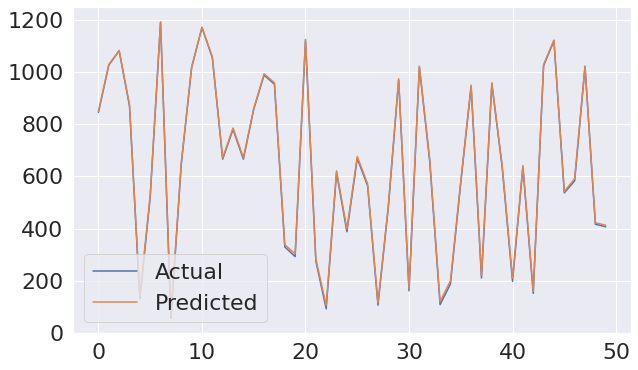

In [151]:
plt.figure(figsize=(10,6))
plt.plot(df[:50])
plt.legend(['Actual' , 'Predicted'])

### Evaluation of Ridge Regression

In [152]:
rid_score = r2_score(y_test , y_pred)
rid_score

0.9877798028370289

In [153]:
p = len(x_train[0])
n = len(y_train)
adj_R2rr = 1-(1-rid_score)*(n-1)/(n-p-1)
adj_R2rr

0.9877776967723723

In [154]:
adj_R2rr < rid_score

True

In [155]:
mse = mean_squared_error(y_test , y_pred)
mse

1343.7682837163593

## Compare betwen 5 models 

In [156]:
dic = {'linear Regression':regv,'Linear Discriminant Analysis':ldav,'Decision Tree':tdtv,'RandomForest Regressor':rfv,'Ridge Regression':ridv}

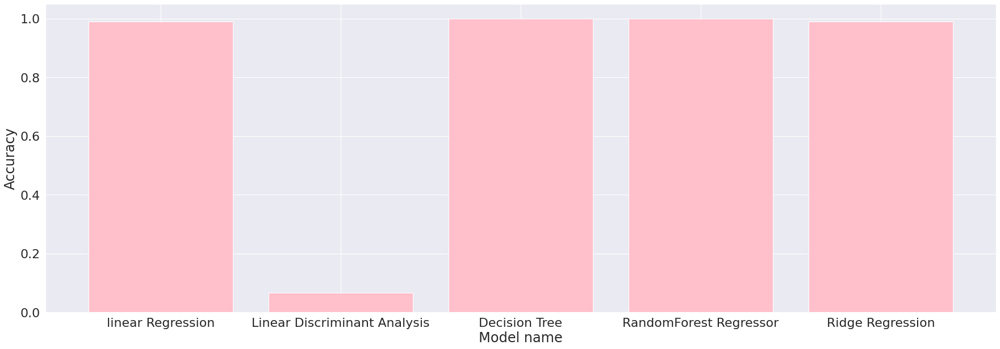

In [157]:
names = list(dic.keys())
values = list(dic.values())
plt.rc('font', size=20)

plt.figure(figsize=(30,10))
plt.xlabel('Model name')
plt.ylabel('Accuracy')

plt.bar(range(len(dic)), values, tick_label=names,color='pink')
plt.show()

### By R^2 

In [158]:
dic2 = {'linear Regression':adj_R2l,'Linear Discriminant Analysis':adj_R2ld,'Decision Tree':adj_R2t,'RandomForest Regressor':adj_R2r,'Ridge Regression':adj_R2rr}

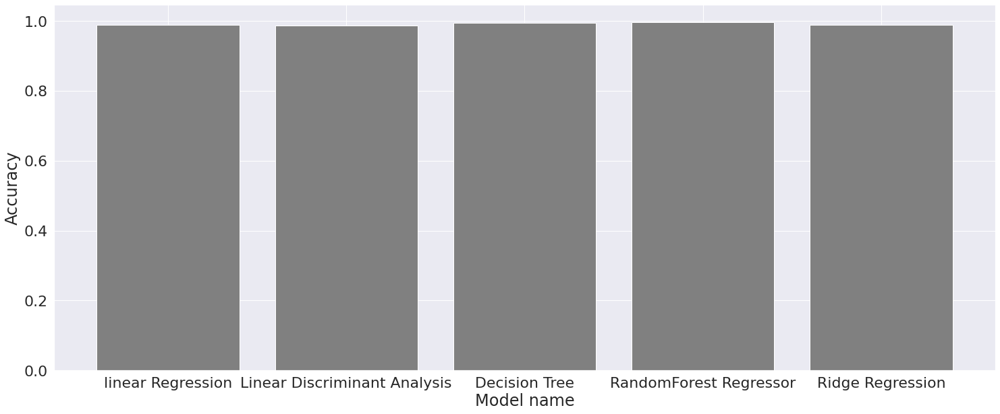

In [159]:
names = list(dic2.keys())
values = list(dic2.values())
plt.rc('font', size=20)

plt.figure(figsize=(25,10))
plt.xlabel('Model name')
plt.ylabel('Accuracy')

plt.bar(range(len(dic)), values, tick_label=names,color='gray')
plt.show()

# THANK YOU 